In [77]:
import os
import psycopg2
import pandas as pd
import hvplot.pandas
from pathlib import Path
import plotly.express as px
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [78]:
conn = psycopg2.connect(
    host="dataviz.ce3i6u4ewfvq.us-east-2.rds.amazonaws.com",
    database="UofT_DB",
    user="postgres",
    password="postgres")
cursor = conn.cursor()

In [79]:
# Read in data from S3 Buckets - OwnerTransactions
owner_transactions = pd.read_sql("select * from ownerstransactions", con=conn)
cursor.close()

In [80]:
owner_transactions.head()


,id,gender,age,status,maritial,city,region,country,countwallet,sumwallet,counttappos,sumtappos,countonlineaut,sumonlineaut,countatm,sumatm
0,AA19975,female,67.0,active,Single,London,ON,Canada,0,0.0,24,1101.77,2,193.93,5,1733.21
1,AA20057,female,67.0,active,Married,Wyoming,ON,Canada,0,0.0,0,0.00,4,2772.24,0,0.00
2,AA20110,female,67.0,active,Married,Kingsville,ON,Canada,0,0.0,0,0.00,4,107.41,1,111.30
3,AA20147,female,67.0,active,Single,Ilderton,ON,Canada,0,0.0,32,2951.51,4,1082.77,0,0.00
4,AA20154,female,67.0,active,Married,Alvinston,ON,Canada,0,0.0,0,0.00,7,3366.89,0,0.00


In [81]:
owner_transactions = owner_transactions.dropna()
owner_transactions

,id,gender,age,status,maritial,city,region,country,countwallet,sumwallet,counttappos,sumtappos,countonlineaut,sumonlineaut,countatm,sumatm
0,AA19975,female,67.0,active,Single,London,ON,Canada,0,0.0,24,1101.77,2,193.93,5,1733.21
1,AA20057,female,67.0,active,Married,Wyoming,ON,Canada,0,0.0,0,0.00,4,2772.24,0,0.00
2,AA20110,female,67.0,active,Married,Kingsville,ON,Canada,0,0.0,0,0.00,4,107.41,1,111.30
3,AA20147,female,67.0,active,Single,Ilderton,ON,Canada,0,0.0,32,2951.51,4,1082.77,0,0.00
4,AA20154,female,67.0,active,Married,Alvinston,ON,Canada,0,0.0,0,0.00,7,3366.89,0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59043,ZW25694,male,52.0,active,Married,Kingsville,ON,Canada,0,0.0,18,1294.71,8,2638.38,0,0.00
59044,ZW28059,male,45.0,active,Married,Tillsonburg,ON,Canada,0,0.0,0,0.00,0,0.00,0,0.00
59045,ZW31386,male,36.0,active,Commonlaw,London,ON,Canada,0,0.0,13,380.71,7,1642.05,0,0.00
59046,ZW31484,male,36.0,active,Single,Thorndale,ON,Canada,0,0.0,0,0.00,0,0.00,0,0.00


In [82]:
#HOW MANY UNIQUE STATUS DO WE HAVE?
owner_transactions["status"].unique()

array(['active', 'Closed', 'frozen', 'closed'], dtype=object)

In [83]:
# DROP ALL THE CLOSED ACCOUNTS
owner_transactions = owner_transactions[(owner_transactions["status"] == 'active') | (owner_transactions["status"] == 'frozen')]


In [84]:
owner_transactions["status"].unique()

array(['active', 'frozen'], dtype=object)

In [85]:
owner_transactions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58974 entries, 0 to 59047
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              58974 non-null  object 
 1   gender          58974 non-null  object 
 2   age             58974 non-null  float64
 3   status          58974 non-null  object 
 4   maritial        58974 non-null  object 
 5   city            58974 non-null  object 
 6   region          58974 non-null  object 
 7   country         58974 non-null  object 
 8   countwallet     58974 non-null  int64  
 9   sumwallet       58974 non-null  float64
 10  counttappos     58974 non-null  int64  
 11  sumtappos       58974 non-null  float64
 12  countonlineaut  58974 non-null  int64  
 13  sumonlineaut    58974 non-null  float64
 14  countatm        58974 non-null  int64  
 15  sumatm          58974 non-null  float64
dtypes: float64(5), int64(4), object(7)
memory usage: 7.6+ MB


In [86]:
features = owner_transactions.drop(["id"],axis=1)

In [87]:
#Keep CUSTOMER ID IN A VARIABLE (out of ML analysis)
customer_id = owner_transactions[["id"]]
customer_id.head(5)

,id
0,AA19975
1,AA20057
2,AA20110
3,AA20147
4,AA20154


In [88]:
#main data for ML = target
features_ownertransactions = owner_transactions.drop(["id"],axis=1)
features_ownertransactions.head()

,gender,age,status,maritial,city,region,country,countwallet,sumwallet,counttappos,sumtappos,countonlineaut,sumonlineaut,countatm,sumatm
0,female,67.0,active,Single,London,ON,Canada,0,0.0,24,1101.77,2,193.93,5,1733.21
1,female,67.0,active,Married,Wyoming,ON,Canada,0,0.0,0,0.00,4,2772.24,0,0.00
2,female,67.0,active,Married,Kingsville,ON,Canada,0,0.0,0,0.00,4,107.41,1,111.30
3,female,67.0,active,Single,Ilderton,ON,Canada,0,0.0,32,2951.51,4,1082.77,0,0.00
4,female,67.0,active,Married,Alvinston,ON,Canada,0,0.0,0,0.00,7,3366.89,0,0.00


In [89]:
# Use get_dummies() to create variables for text features.
X = pd.get_dummies(features_ownertransactions, columns=["gender","status","maritial","city","region","country"])
X.head(5)

,age,countwallet,sumwallet,counttappos,sumtappos,countonlineaut,sumonlineaut,countatm,sumatm,gender_,...,country_Canada,country_Germany,country_Ireland,country_Japan,country_Netherlands,country_Other,country_Sweden,country_Switzerland,country_United Kingdom,country_United States
0,67.0,0,0.0,24,1101.77,2,193.93,5,1733.21,0,...,1,0,0,0,0,0,0,0,0,0
1,67.0,0,0.0,0,0.00,4,2772.24,0,0.00,0,...,1,0,0,0,0,0,0,0,0,0
2,67.0,0,0.0,0,0.00,4,107.41,1,111.30,0,...,1,0,0,0,0,0,0,0,0,0
3,67.0,0,0.0,32,2951.51,4,1082.77,0,0.00,0,...,1,0,0,0,0,0,0,0,0,0
4,67.0,0,0.0,0,0.00,7,3366.89,0,0.00,0,...,1,0,0,0,0,0,0,0,0,0


In [90]:
#Resize the distribution of values (Standart Scaler)
X_scaled = StandardScaler().fit_transform(X)
print(X_scaled[0:5])

[[ 0.84308137 -0.02828264 -0.02711593 ... -0.00582361 -0.00411788
  -0.05700209]
 [ 0.84308137 -0.02828264 -0.02711593 ... -0.00582361 -0.00411788
  -0.05700209]
 [ 0.84308137 -0.02828264 -0.02711593 ... -0.00582361 -0.00411788
  -0.05700209]
 [ 0.84308137 -0.02828264 -0.02711593 ... -0.00582361 -0.00411788
  -0.05700209]
 [ 0.84308137 -0.02828264 -0.02711593 ... -0.00582361 -0.00411788
  -0.05700209]]


In [91]:
#Initializing a PCA model in order to reduce the features to 3
pca = PCA (n_components=3)

In [92]:
#PCA Training 
X_pca = pca.fit_transform(X_scaled)

In [93]:
pcs_df = pd.DataFrame(
    data = X_pca, columns=["PC1","PC2","PC3"], index = owner_transactions.index)

print(pcs_df.shape)
pcs_df.head()

(58974, 3)


,PC1,PC2,PC3
0,-0.191654,0.064099,-0.063994
1,-0.164097,-0.050973,0.048139
2,-0.168712,-0.052310,0.047130
3,-0.192159,0.077422,-0.101668
4,-0.169066,-0.044616,0.028945


In [94]:
#ELbow Curve (KMeans)

inertia= []
k = list(range(1,11))
for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(pcs_df)
    inertia.append(km.inertia_)

#Create the elbow Curve
elbow_data = {"k":k,"inertia":inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", xticks=k,title= "Elbow Curve")


:Curve   [k]   (inertia)

In [95]:
#Initialize a kMeans  model
model = KMeans(n_clusters=4, random_state=2)

#fit the model
model.fit(pcs_df)

#predict clusters
prediction = model.predict(pcs_df)
prediction

array([0, 0, 0, ..., 0, 0, 0])

In [96]:
#Create new dataframe including predicted clusters and owner_transactions features

# Concatentate the features_ownertransactions and pcs_df DataFrames on the same columns.

data = [features_ownertransactions,pcs_df]
clustered_df = pd.concat([features_ownertransactions,pcs_df], join="inner",axis=1)

In [97]:
clustered_df.head()

,gender,age,status,maritial,city,region,country,countwallet,sumwallet,counttappos,sumtappos,countonlineaut,sumonlineaut,countatm,sumatm,PC1,PC2,PC3
0,female,67.0,active,Single,London,ON,Canada,0,0.0,24,1101.77,2,193.93,5,1733.21,-0.191654,0.064099,-0.063994
1,female,67.0,active,Married,Wyoming,ON,Canada,0,0.0,0,0.00,4,2772.24,0,0.00,-0.164097,-0.050973,0.048139
2,female,67.0,active,Married,Kingsville,ON,Canada,0,0.0,0,0.00,4,107.41,1,111.30,-0.168712,-0.052310,0.047130
3,female,67.0,active,Single,Ilderton,ON,Canada,0,0.0,32,2951.51,4,1082.77,0,0.00,-0.192159,0.077422,-0.101668
4,female,67.0,active,Married,Alvinston,ON,Canada,0,0.0,0,0.00,7,3366.89,0,0.00,-0.169066,-0.044616,0.028945


In [98]:
#  Add a new column, "customer_id" to the clustered_df DataFrame that holds the ID of the Owners 
clustered_df = clustered_df.merge(customer_id, left_index=True, right_index=True)

In [99]:
#add a new column "Class" to the clustered_df Dataframe that holds the predictions
clustered_df["class"] = model.labels_


In [100]:
# Print the shape of the clustered_df
print(clustered_df.shape)
clustered_df.head(10)

(58974, 20)


,gender,age,status,maritial,city,region,country,countwallet,sumwallet,counttappos,sumtappos,countonlineaut,sumonlineaut,countatm,sumatm,PC1,PC2,PC3,id,class
0,female,67.0,active,Single,London,ON,Canada,0,0.0,24,1101.77,2,193.93,5,1733.21,-0.191654,0.064099,-0.063994,AA19975,0
1,female,67.0,active,Married,Wyoming,ON,Canada,0,0.0,0,0.00,4,2772.24,0,0.00,-0.164097,-0.050973,0.048139,AA20057,0
2,female,67.0,active,Married,Kingsville,ON,Canada,0,0.0,0,0.00,4,107.41,1,111.30,-0.168712,-0.052310,0.047130,AA20110,0
3,female,67.0,active,Single,Ilderton,ON,Canada,0,0.0,32,2951.51,4,1082.77,0,0.00,-0.192159,0.077422,-0.101668,AA20147,0
4,female,67.0,active,Married,Alvinston,ON,Canada,0,0.0,0,0.00,7,3366.89,0,0.00,-0.169066,-0.044616,0.028945,AA20154,0
5,female,67.0,active,Married,London,ON,Canada,0,0.0,0,0.00,3,934.19,0,0.00,-0.169940,-0.053298,0.064171,AA20275,0
6,female,66.0,active,Married,London,ON,Canada,0,0.0,0,0.00,1,50.00,0,0.00,-0.168046,-0.057031,0.075267,AA20411,0
7,female,66.0,active,Married,Molenhoek 6584dg,,Netherlands,0,0.0,0,0.00,0,0.00,0,0.00,32.303566,1.845462,69.342502,AA20435,3
8,female,66.0,active,Married,London,ON,Canada,0,0.0,0,0.00,0,0.00,0,0.00,-0.166965,-0.058581,0.079083,AA20469,0
9,female,66.0,active,Married,Caledonia,ON,Canada,0,0.0,17,1804.33,11,13979.49,0,0.00,-0.207388,0.008199,-0.113134,AA20480,0


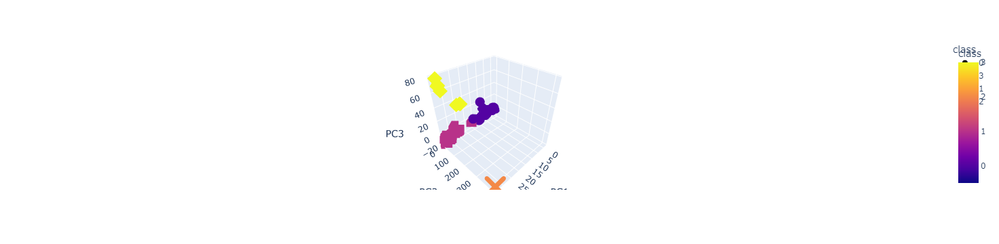

In [101]:
#Create a 3D-Scatter with the PCA data and the clusters
fig = px.scatter_3d(clustered_df, x="PC1", y="PC2", z="PC3", color="class",symbol="class",width=800, hover_name="id")
fig.show()

In [103]:
#Name of the COlumns
clustered_df.columns.tolist()

['gender',
 'age',
 'status',
 'maritial',
 'city',
 'region',
 'country',
 'countwallet',
 'sumwallet',
 'counttappos',
 'sumtappos',
 'countonlineaut',
 'sumonlineaut',
 'countatm',
 'sumatm',
 'PC1',
 'PC2',
 'PC3',
 'id',
 'class']

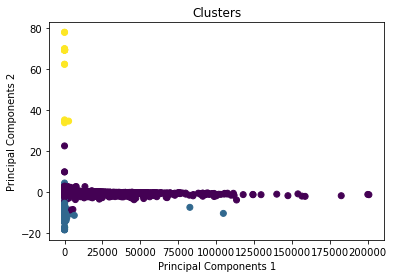

In [108]:
import matplotlib.pyplot as plt

#2D Visualization of Clusters (0-4)
plt.scatter(x=clustered_df["sumonlineaut"], y=clustered_df['PC3'], c=clustered_df["class"])
plt.xlabel("Principal Components 1")
plt.ylabel("Principal Components 2")
plt.title("Clusters")
plt.show()

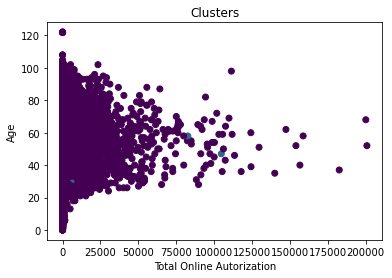

In [109]:
#2D Visualization of Clusters ( sumonlineaut - age)
plt.scatter(x=clustered_df["sumonlineaut"], y=clustered_df['age'], c=clustered_df["class"])
plt.xlabel("Total Online Autorization")
plt.ylabel("Age")
plt.title("Clusters")
plt.show()

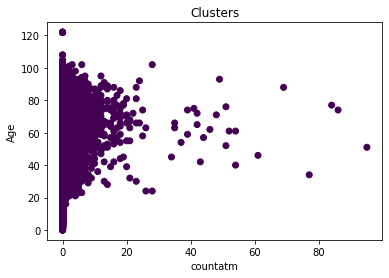

In [115]:
plt.scatter(x=clustered_df["countatm"], y=clustered_df['age'], c=clustered_df["class"])
plt.xlabel("countatm")
plt.ylabel("Age")
plt.title("Clusters")
plt.show()